In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq
import random

random.seed(10)
print(random.random())

0.5714025946899135


In [ ]:
adata = sc.read_10x_h5(filename="1_464/output-XETG00045__0021464__1__20240612__152143/cell_feature_matrix.h5")

In [ ]:
adata

AnnData object with n_obs × n_vars = 51335 × 347
    var: 'gene_ids', 'feature_types', 'genome'

In [ ]:
adata.var

,gene_ids,feature_types,genome
2010300C02Rik,ENSMUSG00000026090,Gene Expression,Unknown
Acsbg1,ENSMUSG00000032281,Gene Expression,Unknown
Acta2,ENSMUSG00000035783,Gene Expression,Unknown
Acvrl1,ENSMUSG00000000530,Gene Expression,Unknown
Adamts2,ENSMUSG00000036545,Gene Expression,Unknown
...,...,...,...
Zfp366,ENSMUSG00000050919,Gene Expression,Unknown
Zfp536,ENSMUSG00000043456,Gene Expression,Unknown
Zfpm2,ENSMUSG00000022306,Gene Expression,Unknown
Zic1,ENSMUSG00000032368,Gene Expression,Unknown


In [ ]:
df = pd.read_csv("1_464/output-XETG00045__0021464__1__20240612__152143/cells.csv.gz")

In [ ]:
df

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area
0,aaacfglh-1,338.520416,1579.328491,38,0,0,0,0,38,91.035003,24.068282
1,aaaejaei-1,344.911743,1594.985962,108,0,0,0,0,108,97.447191,32.060939
2,aaaeodco-1,348.170319,1588.809814,31,0,0,0,0,31,39.421408,26.958282
3,aaahlcjm-1,348.865540,1574.453369,60,0,0,0,0,60,113.251879,33.641407
4,aaaiamfm-1,344.182098,1584.404907,35,0,0,0,0,35,57.077502,32.286720
...,...,...,...,...,...,...,...,...,...,...,...
51330,oijniibc-1,1523.884766,2594.094971,80,0,0,0,0,80,47.775314,31.880314
51331,oijnjpgk-1,1533.911987,2595.688477,119,0,0,0,0,119,65.295940,20.139688
51332,oijoobof-1,1535.497803,2571.373779,70,0,0,0,0,70,45.336877,38.969845
51333,oijpfioh-1,1523.922363,2574.847656,143,0,0,0,0,143,96.589222,55.451877


In [ ]:
df.set_index(adata.obs_names, inplace=True)
adata.obs = df.copy()

In [ ]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area
aaacfglh-1,aaacfglh-1,338.520416,1579.328491,38,0,0,0,0,38,91.035003,24.068282
aaaejaei-1,aaaejaei-1,344.911743,1594.985962,108,0,0,0,0,108,97.447191,32.060939
aaaeodco-1,aaaeodco-1,348.170319,1588.809814,31,0,0,0,0,31,39.421408,26.958282
aaahlcjm-1,aaahlcjm-1,348.865540,1574.453369,60,0,0,0,0,60,113.251879,33.641407
aaaiamfm-1,aaaiamfm-1,344.182098,1584.404907,35,0,0,0,0,35,57.077502,32.286720
...,...,...,...,...,...,...,...,...,...,...,...
oijniibc-1,oijniibc-1,1523.884766,2594.094971,80,0,0,0,0,80,47.775314,31.880314
oijnjpgk-1,oijnjpgk-1,1533.911987,2595.688477,119,0,0,0,0,119,65.295940,20.139688
oijoobof-1,oijoobof-1,1535.497803,2571.373779,70,0,0,0,0,70,45.336877,38.969845
oijpfioh-1,oijpfioh-1,1523.922363,2574.847656,143,0,0,0,0,143,96.589222,55.451877


In [ ]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [ ]:
adata.obsm

AxisArrays with keys: spatial

In [ ]:
df1 = pd.read_csv("/home/julia/Xenioum/1_464/output-XETG00045__0021464__1__20240612__152143/metrics_summary.csv")
df1

,run_name,cassette_name,region_name,panel_name,panel_design_id,predesigned_panel_id,region_area,total_cell_area,total_high_quality_decoded_transcripts,fraction_transcripts_decoded_q20,...,fraction_of_ambiguous_cell_mask_pixels,fraction_of_nucleus_polygons_removed,fraction_of_cell_polygons_removed,fraction_of_nuclei_without_cell,number_of_cell_non_simple_polygons,number_of_cell_multi_polygons,number_of_nucleus_non_simple_polygons,number_of_nucleus_multi_polygons,segmented_cell_imported_frac,segmented_cell_imported_count
0,240612_Adameyko_run1,EmbryonicDay_8_5,1,mBrain_100g,CAZWM2,mBrain_v1.1,1.714462e+07,3.960235e+06,5391779,0.402973,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
table=adata.obs.copy()

In [ ]:
table['region'] = 1
table['EmbryonicDay_8_5'] = 8.5
table['cell_id_duplicate'] = '8_5_region1_' + table['cell_id']
adata.obs=table

In [ ]:
prefix = "8_5_region1_"
adata.obs['cell_id'] = prefix + adata.obs['cell_id']

In [ ]:
### Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=(10, 20,30,40), inplace=True)

In [ ]:
### calculate and print the percentage of control probes
cprobes = (adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100)
print(f"Negative DNA probe count % : {cprobes}")

Negative DNA probe count % : 0.012839576267273809


In [ ]:
### calculate and print the percentage of control codewords
cwords = (adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100)
print(f"Negative decoding count % : {cwords}")

Negative decoding count % : 0.012725107533836003


<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

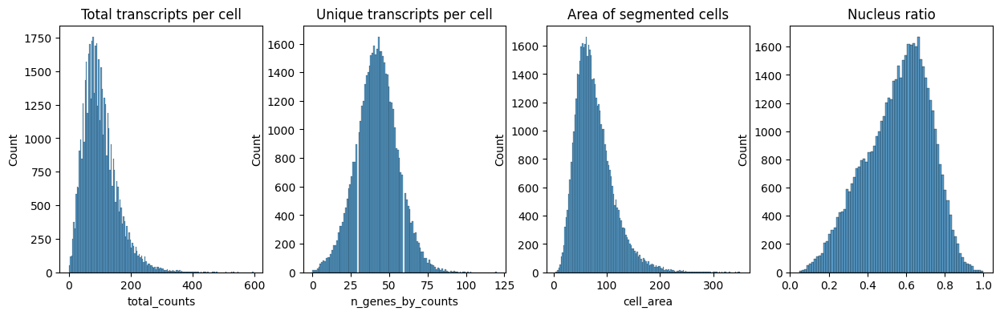

In [ ]:
### plot the distribution of:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])

axs[1].set_title("Unique transcripts per cell")
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, ax=axs[1])

axs[2].set_title("Area of segmented cells")
sns.histplot(adata.obs["cell_area"], kde=False, ax=axs[2])

axs[3].set_title("Nucleus ratio")
sns.histplot(adata.obs["nucleus_area"] / adata.obs["cell_area"], kde=False, ax=axs[3])

In [ ]:
adata

AnnData object with n_obs × n_vars = 51335 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'EmbryonicDay_8_5', 'cell_id_duplicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial'

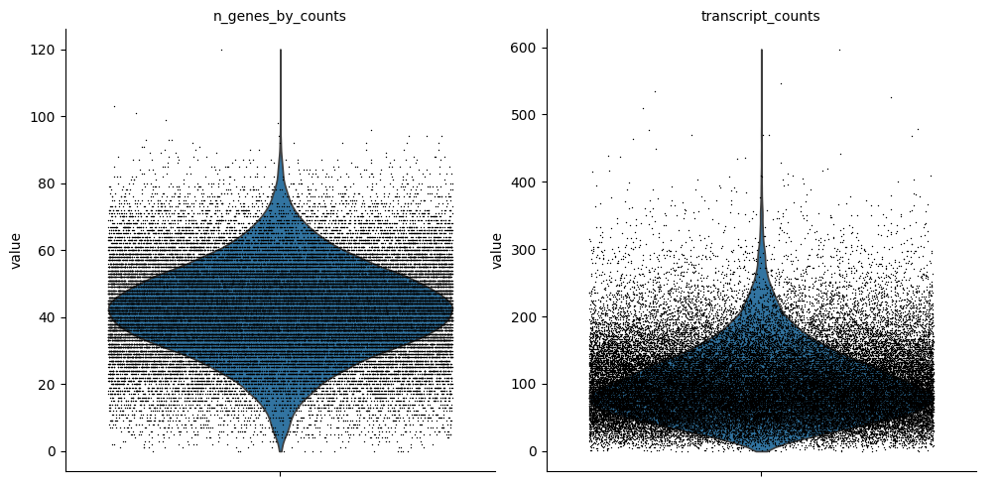

In [ ]:
# Visualize the number of genes and transcripts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'transcript_counts'], jitter=0.4, multi_panel=True)

In [ ]:
# Subset the data
adata = adata[(adata.obs['n_genes_by_counts'] > 20) & (adata.obs['n_genes_by_counts'] < 100) &
            (adata.obs['transcript_counts'] > 20) & (adata.obs['transcript_counts'] < 500), :]

In [ ]:
adata

View of AnnData object with n_obs × n_vars = 48463 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'EmbryonicDay_8_5', 'cell_id_duplicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial'

In [ ]:
adata.write_h5ad('/home/julia/Xenioum/h5ad/1_464_working_qc.h5ad')

In [ ]:
adata.raw = adata

In [ ]:
## standard scanpy workflow
sc.pp.normalize_total(adata, inplace=True) # Normalize counts per cell
sc.pp.log1p(adata) # Logarithmize

# sc.pp.highly_variable_genes (adata) # 313 genes

sc.pp.pca(adata) # do principal component analysis
sc.pp.neighbors(adata, n_neighbors=35, n_pcs=15) # compute a neighborhood graph
sc.tl.umap(adata) # embed the neighborhood graph of the data
sc.tl.leiden(adata, resolution=6.5) # cluster the cells into subgroups

/tmp/ipykernel_2622447/2771341329.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=6.5) # cluster the cells into subgroups


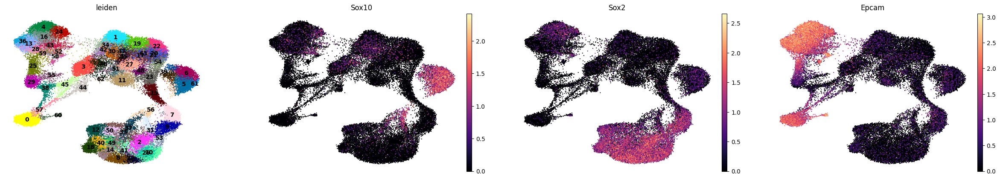

In [ ]:
sc.pl.umap(adata, color=['leiden', 'Sox10', 'Sox2', 'Epcam'],
           size=10, frameon=False,  color_map='magma', legend_loc='on data')

In [ ]:
adata

AnnData object with n_obs × n_vars = 48463 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'EmbryonicDay_8_5', 'cell_id_duplicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

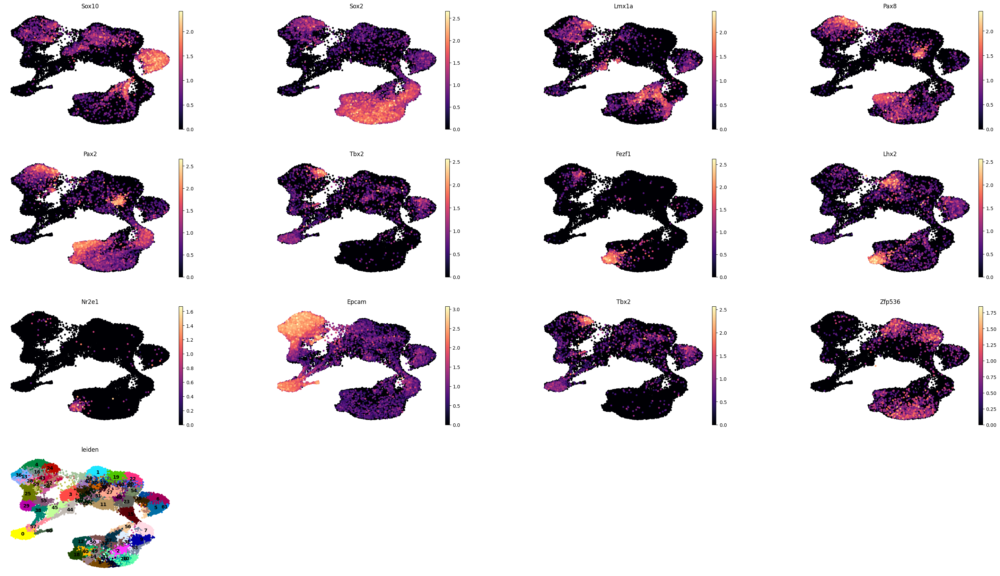

In [ ]:
# Otic
sc.pl.umap(adata, color=['Sox10','Sox2', 'Lmx1a' , 'Pax8',  'Pax2','Tbx2','Fezf1', 'Lhx2' , 'Nr2e1',  'Epcam',
                 'Tbx2',  'Zfp536' , 'leiden', ]

                       , legend_loc='on data', wspace=0.4, frameon=False, size=60, color_map='magma')

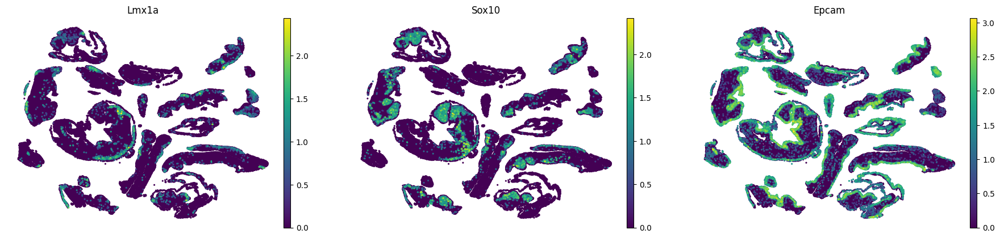

In [ ]:
adata.obsm["X_spatial"] = adata.obsm["spatial"].copy()
sc.pl.embedding(adata, basis="X_spatial", color=['Lmx1a', 'Sox10', 'Epcam'], frameon=False, s=20)

/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


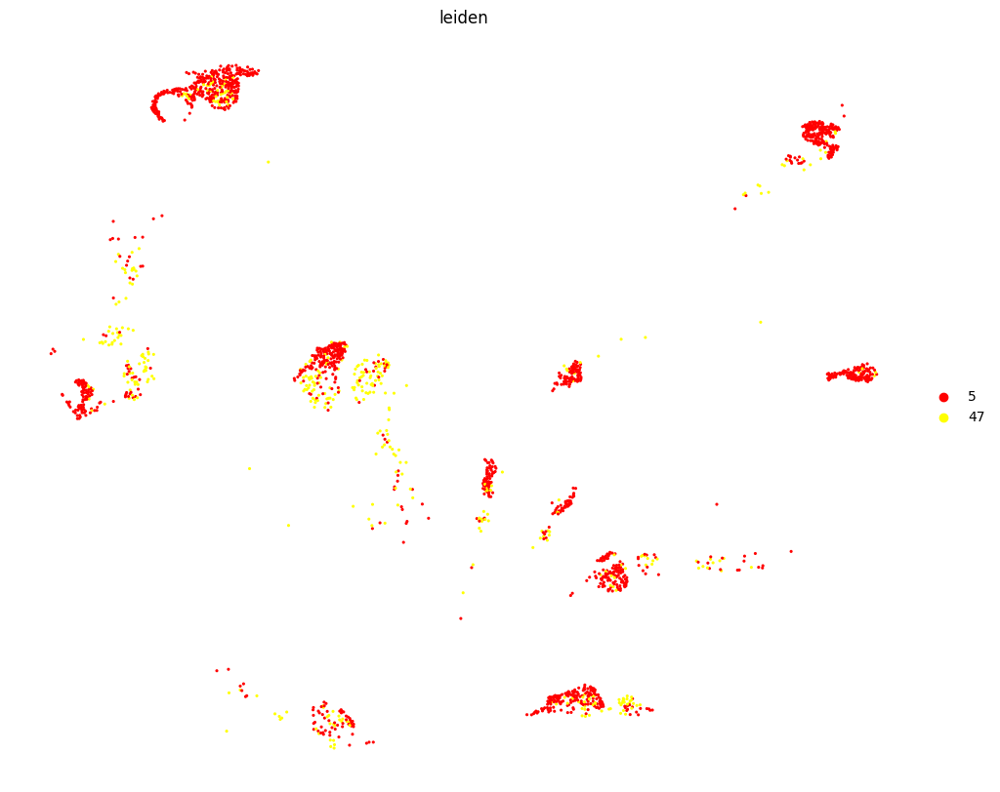

In [ ]:
# Subset the data for clusters 3 and 22
clusters_3_22 = adata[adata.obs['leiden'].isin([  '5',   '47']), :]

# Define a custom color map
cluster_colors = {
 #  '34': 'blue',
'5': 'red',
  #  '21': 'purple',
 #    '36': 'yellow',
  #  '20':'grey',
    '47':'yellow',

# '26':'green',


}

# Set the figure size
plt.rcParams['figure.figsize'] = [12, 10]  # width, height in inches

# Plot the spatial embedding for clusters 3 and 22 with custom colors
sc.pl.embedding(
    clusters_3_22,
    basis='X_spatial',
    color='leiden',
    size=20,
    frameon=False,
    palette=[cluster_colors[str(i)] for i in clusters_3_22.obs['leiden'].cat.categories]
)


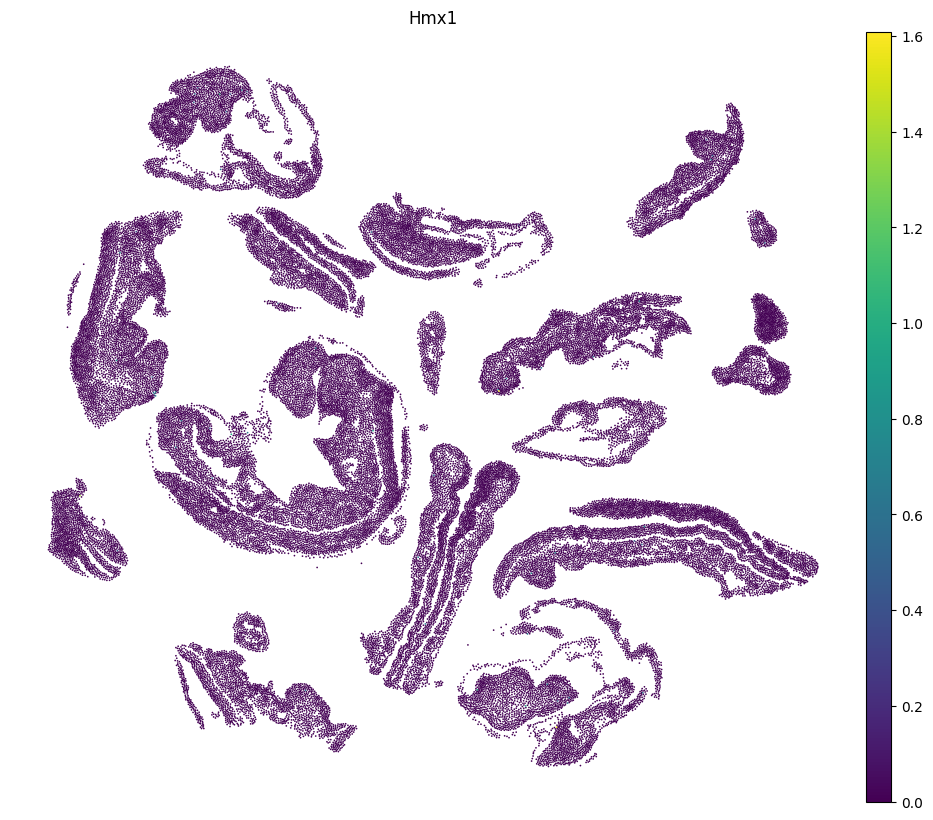

In [ ]:
sc.pl.embedding(adata, basis="X_spatial", color=['Hmx1'], frameon=False, s=6)

In [ ]:
adata

AnnData object with n_obs × n_vars = 48463 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'EmbryonicDay_8_5', 'cell_id_duplicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_30_genes', 'pct_counts_in_top_40_genes', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'X_spatial'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

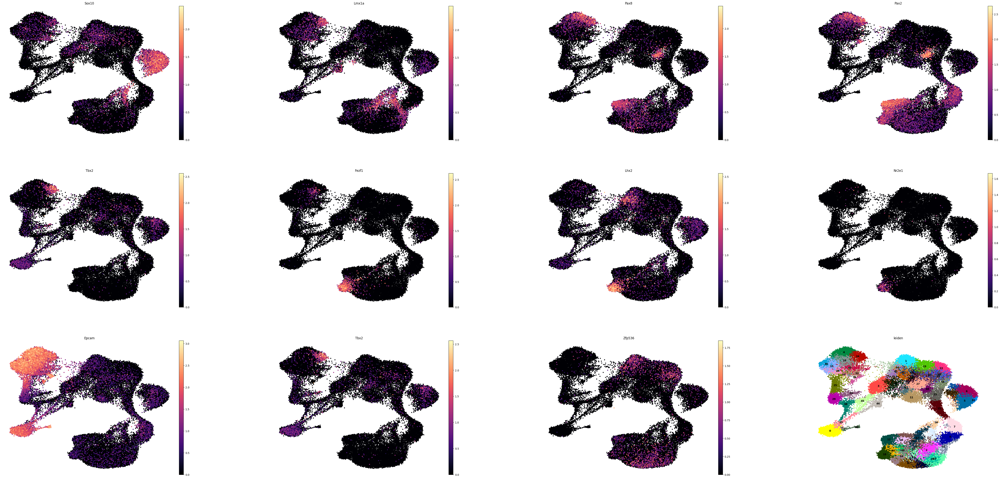

In [ ]:
# Otic
sc.pl.umap(adata, color=['Sox10', 'Lmx1a' , 'Pax8',  'Pax2','Tbx2','Fezf1', 'Lhx2' , 'Nr2e1',  'Epcam',
                 'Tbx2',  'Zfp536' , 'leiden', ]

                       , legend_loc='on data', wspace=0.4, frameon=False, size=60, color_map='magma')

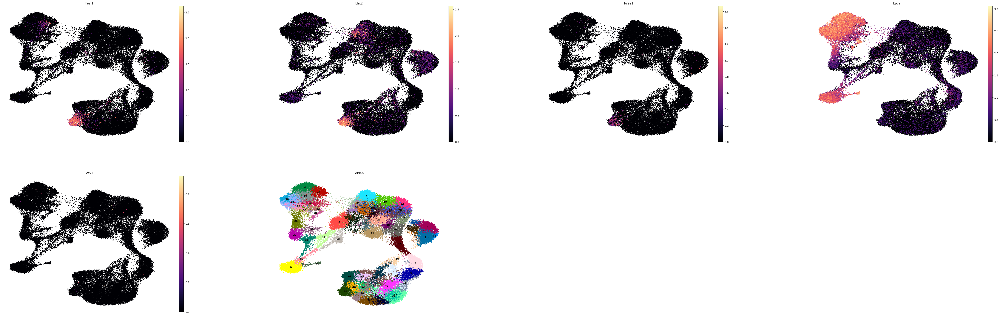

In [ ]:
# Olfactory placode

sc.pl.umap(adata, color=['Fezf1', 'Lhx2' , 'Nr2e1',  'Epcam',
                 'Vax1',  'leiden']

                       , legend_loc='on data', wspace=0.4, frameon=False, size=40, color_map='magma')